## [作業重點]
目前你應該已經要很清楚資料集中，資料的型態是什麼樣子囉！包含特徵 (features) 與標籤 (labels)。因此要記得未來不管什麼專案，必須要把資料清理成相同的格式，才能送進模型訓練。
今天的作業開始踏入決策樹這個非常重要的模型，請務必確保你理解模型中每個超參數的意思，並試著調整看看，對最終預測結果的影響為何

## 作業

1. 試著調整 DecisionTreeClassifier(...) 中的參數，並觀察是否會改變結果？
2. 改用其他資料集 (boston, wine)，並與回歸模型的結果進行比較

In [1]:
from sklearn import datasets, metrics

# 如果是分類問題，請使用 DecisionTreeClassifier，若為回歸問題，請使用 DecisionTreeRegressor
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.model_selection import train_test_split
from sklearn import neighbors

## iris

In [2]:
# 讀取鳶尾花資料集
iris = datasets.load_iris()

# 切分訓練集/測試集
x_train, x_test, y_train, y_test = train_test_split(iris.data, iris.target, test_size=0.25, random_state=4)


In [3]:
# 建立模型
clf1 = DecisionTreeClassifier()
clf2 = DecisionTreeClassifier(criterion='entropy')
clf3 = DecisionTreeClassifier(min_samples_leaf=50)
clf4 = neighbors.KNeighborsClassifier() #defaure:k=5

In [4]:
# 訓練模型
clf1.fit(x_train, y_train)
clf2.fit(x_train, y_train)
clf3.fit(x_train, y_train)
clf4.fit(x_train, y_train)

# 預測測試集
y_pred1 = clf1.predict(x_test)
y_pred2 = clf2.predict(x_test)
y_pred3 = clf3.predict(x_test)
y_pred4 = clf4.predict(x_test)

In [5]:
print("x_test:",y_test)
print("y_pred1:",y_pred1)
print("y_pred2:",y_pred2)
print("y_pred3:",y_pred3)
print("y_pred4:",y_pred4)

x_test: [2 0 2 2 2 1 1 0 0 2 0 0 0 1 2 0 1 0 0 2 0 2 1 0 0 0 0 0 0 2 1 0 2 0 1 2 2
 1]
y_pred1: [2 0 2 2 2 1 2 0 0 2 0 0 0 1 2 0 1 0 0 2 0 2 1 0 0 0 0 0 0 2 1 0 2 0 1 2 2
 1]
y_pred2: [2 0 2 2 2 1 2 0 0 2 0 0 0 1 2 0 1 0 0 2 0 2 1 0 0 0 0 0 0 2 1 0 2 0 1 2 2
 1]
y_pred3: [2 0 2 2 2 2 2 0 0 2 0 0 0 2 2 0 0 0 0 2 0 2 2 0 0 0 0 0 0 2 2 0 2 0 0 2 2
 0]
y_pred4: [2 0 2 2 2 1 2 0 0 2 0 0 0 1 2 0 1 0 0 2 0 2 1 0 0 0 0 0 0 2 1 0 2 0 1 2 2
 1]


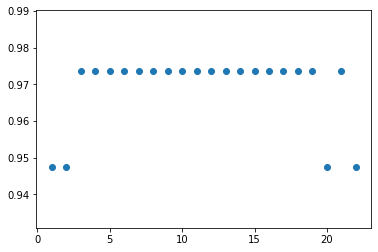

3


In [8]:
# 選擇 k #KNN clf5
import numpy as np
import matplotlib.pyplot as plt

range = np.arange(1, round(0.2 * x_train.shape[0]) + 1)
accuracies = []

for i in range:
    clf5 = neighbors.KNeighborsClassifier(n_neighbors = i)
    clf5.fit(x_train, y_train)
    y_pred5 = clf5.predict(x_test)
    acc5 = metrics.accuracy_score(y_test, y_pred5)
    accuracies.append(acc5)

    '''
    clf = neighbors.KNeighborsClassifier(n_neighbors = i)
    iris_clf = clf.fit(train_X, train_y)
    test_y_predicted = iris_clf.predict(test_X)
    accuracy = metrics.accuracy_score(test_y, test_y_predicted)
    accuracies.append(accuracy)
    '''
    
# 視覺化
plt.scatter(range, accuracies)
plt.show()
appr_k = accuracies.index(max(accuracies)) + 1
print(appr_k)
#max_depth=2

In [10]:
clf6 = DecisionTreeClassifier(max_depth=3)
clf6.fit(x_train, y_train)
y_pred6 = clf6.predict(x_test)
print("y_pred6:",y_pred6)

y_pred6: [2 0 2 2 2 1 2 0 0 2 0 0 0 1 2 0 1 0 0 2 0 2 1 0 0 0 0 0 0 2 1 0 2 0 1 2 2
 1]


In [11]:
acc1 = metrics.accuracy_score(y_test, y_pred1)
print("Acuuracy1: ", acc1)
print('Depth1: ', clf1.get_depth())
acc2 = metrics.accuracy_score(y_test, y_pred2)
print("Acuuracy2: ", acc2)
print('Depth2: ', clf2.get_depth())
acc3 = metrics.accuracy_score(y_test, y_pred3)
print("Acuuracy3: ", acc3)
print('Depth3: ', clf3.get_depth())
acc4 = metrics.accuracy_score(y_test, y_pred2)
print("Acuuracy4: ", acc4)
#print('Depth4: ', clf4.get_depth())
acc5 = metrics.accuracy_score(y_test, y_pred5)
print("Acuuracy5: ", acc5)
#print('Depth5: ', clf5.get_depth())
acc6 = metrics.accuracy_score(y_test, y_pred6)
print("Acuuracy6: ", acc6)
print('Depth6: ', clf6.get_depth())

Acuuracy1:  0.9736842105263158
Depth1:  4
Acuuracy2:  0.9736842105263158
Depth2:  4
Acuuracy3:  0.7894736842105263
Depth3:  1
Acuuracy4:  0.9736842105263158
Acuuracy5:  0.9473684210526315
Acuuracy6:  0.9736842105263158
Depth6:  3


In [10]:
print(iris.feature_names)

['sepal length (cm)', 'sepal width (cm)', 'petal length (cm)', 'petal width (cm)']


In [13]:
print("Feature importance1: ", clf1.feature_importances_)
print("Feature importance2: ", clf2.feature_importances_)
print("Feature importance3: ", clf3.feature_importances_)
#print("Feature importance4: ", clf4.feature_importances_)
#print("Feature importance5: ", clf5.feature_importances_)
print("Feature importance6: ", clf6.feature_importances_)

Feature importance1:  [0.01796599 0.         0.52229134 0.45974266]
Feature importance2:  [0.         0.0156062  0.07501716 0.90937664]
Feature importance3:  [0. 0. 1. 0.]
Feature importance6:  [0.         0.         0.55828357 0.44171643]


In [14]:
!pip install pydotplus

     |████████████████████████████████| 286kB 389kB/s eta 0:00:01
  Stored in directory: /home/user01/.cache/pip/wheels/35/7b/ab/66fb7b2ac1f6df87475b09dc48e707b6e0de80a6d8444e3628
Successfully built pydotplus


/home/user01/.conda/envs/CUDA9_p36_1/lib/python3.6/site-packages/sklearn/externals/six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)


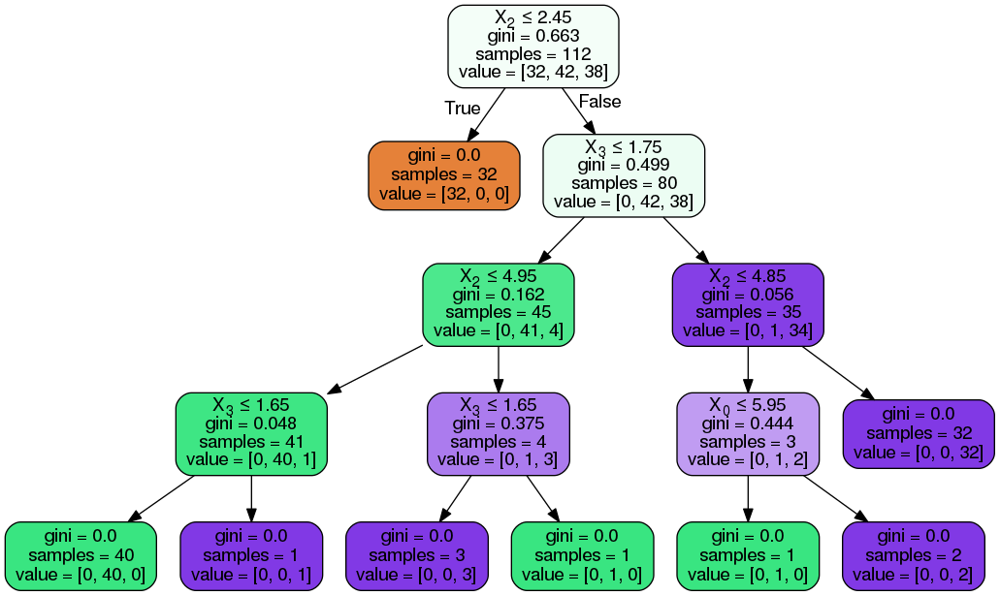

In [14]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(clf1, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

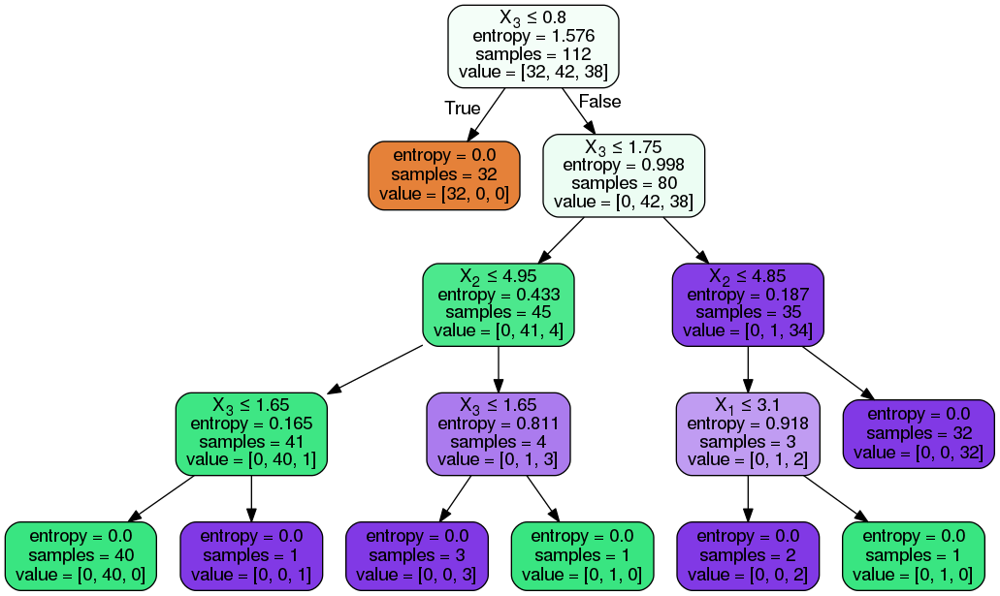

In [15]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(clf2, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

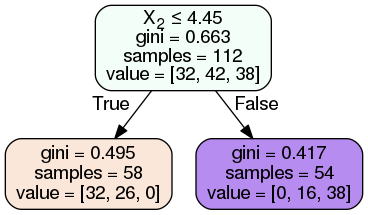

In [16]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(clf3, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

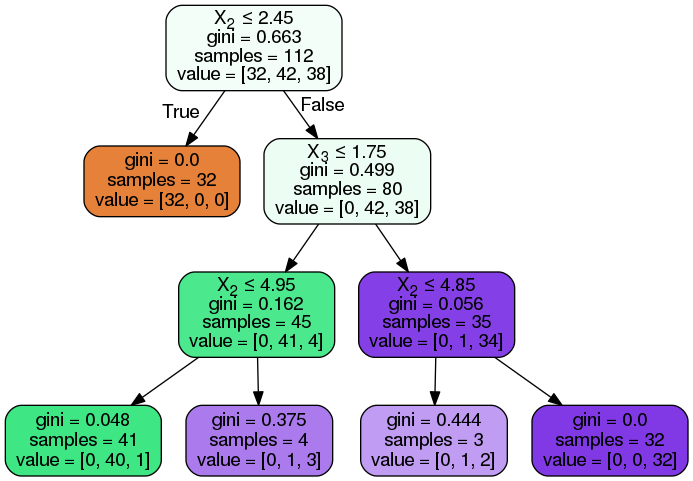

In [17]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(clf6, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

## boston

In [ ]:
# 如果是分類問題，請使用 DecisionTreeClassifier，
#若為回歸問題，請使用 DecisionTreeRegressor


In [27]:
# 讀取boston資料集
boston = datasets.load_boston()

In [28]:
print(boston.DESCR)

.. _boston_dataset:

Boston house prices dataset
---------------------------

**Data Set Characteristics:**  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pu

In [29]:
print(boston.feature_names)

['CRIM' 'ZN' 'INDUS' 'CHAS' 'NOX' 'RM' 'AGE' 'DIS' 'RAD' 'TAX' 'PTRATIO'
 'B' 'LSTAT']


In [30]:
# 切分訓練集/測試集
x_train, x_test, y_train, y_test = train_test_split(boston.data, boston.target, test_size=0.25, random_state=4)


In [31]:
print('The max target value is',np.max(boston.target))
print('The min target value is',np.min(boston.target))
print('The average target value is',np.mean(boston.target))

The max target value is 50.0
The min target value is 5.0
The average target value is 22.532806324110677


In [33]:
from sklearn.tree import DecisionTreeRegressor
dtr=DecisionTreeRegressor()
dtr.fit(x_train,y_train)
dtr_y_predict=dtr.predict(x_test)

In [34]:
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error

print('R-squared value of DecisionTreeRegressor:',dtr.score(x_test,y_test))
print('The mean squared error of DecisionTreeRegressor:',mean_squared_error(y_test,dtr_y_predict))
print('The mean absolute error of DecisionTreeRegressor:',mean_absolute_error(y_test,dtr_y_predict))


R-squared value of DecisionTreeRegressor: 0.6963426934021073
The mean squared error of DecisionTreeRegressor: 30.467007874015746
The mean absolute error of DecisionTreeRegressor: 3.520472440944882


In [36]:
import numpy as np
from IPython.display import Image  
from sklearn import tree
import pydotplus 
#import graphviz
dot_data = tree.export_graphviz(dtr, out_file=None, 
                         feature_names=boston.feature_names,  
                         class_names=['0','1'], 
                         filled=True, rounded=True,  
                         special_characters=True)   #feature_names格式是np.array
graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png())


In [39]:
!pip install graphviz

In [40]:
import numpy as np
from IPython.display import Image  
from sklearn import tree
import pydotplus 
import graphviz
dot_data = tree.export_graphviz(dtr, out_file=None, 
                         feature_names=boston.feature_names,  
                         class_names=['0','1'], 
                         filled=True, rounded=True,  
                         special_characters=True)   #feature_names格式是np.array
graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png())


In [41]:
#第三步：训练数据和测试数据标准化处理
from sklearn.preprocessing import StandardScaler
#分别初始化对特征值和目标值的标准化器
ss_X = StandardScaler()
ss_y = StandardScaler()
#训练数据都是数值型，所以要标准化处理
x_strain = ss_X.fit_transform(x_train)
x_stest = ss_X.transform(x_test)
#目标数据（房价预测值）也是数值型，所以也要标准化处理
#说明一下：fit_transform与transform都要求操作2D数据，而此时的y_train与y_test都是1D的，因此需要调用reshape(-1,1)，例如：[1,2,3]变成[[1],[2],[3]]
y_strain = ss_y.fit_transform(y_train.reshape(-1,1))
y_stest = ss_y.transform(y_test.reshape(-1,1))

In [42]:
#第四步：使用单一回归树模型进行训练，并且对测试数据进行预测
from sklearn.tree import DecisionTreeRegressor
#1.初始化k近邻回归器，并且调整配置，使得预测方式为平均回归：weights = 'uniform'
dtr = DecisionTreeRegressor()
dtr.fit(x_strain,y_strain)
dtr_y_predict = dtr.predict(x_stest)

In [44]:
#第五步：对单一回归树模型在测试集下进行性能评估
#使用R-squared、MSE、MAE指标评估
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
print('R-squared value of DecisionTreeRegressor is',dtr.score(x_stest,y_stest))
print('the MSE of DecisionTreeRegressor is',mean_squared_error(ss_y.inverse_transform(y_stest),ss_y.inverse_transform(dtr_y_predict)))
print('the MAE of DecisionTreeRegressor is',mean_absolute_error(ss_y.inverse_transform(y_stest),ss_y.inverse_transform(dtr_y_predict)))

R-squared value of DecisionTreeRegressor is 0.7488879145481564
the MSE of DecisionTreeRegressor is 25.19496062992126
the MAE of DecisionTreeRegressor is 3.3181102362204724


#Non-StandardScaler
R-squared value of DecisionTreeRegressor: 0.6963426934021073
The mean squared error of DecisionTreeRegressor: 30.467007874015746
The mean absolute error of DecisionTreeRegressor: 3.520472440944882

＃總結：
＃樹模型的優點：
＃1。可以解決非線性特徵（目標與特徵直接不存在線性關係）的問題
＃2。樹模型不要求對特徵標準化和統一量化
＃樹模型的缺點：
＃1。由於可以解決複雜的非線性問題，容易產生過擬合
＃2。從上至下的預測流程會因為數據細微的更改而產生較大的結構變化，因此預測穩定性差
＃3。構建最佳的樹模型是NP-hard問題，只能採用類似貪婪算法的解法找到一些次優解